### Импорт библиотек

In [141]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import MinMaxScaler, StandardScaler, OrdinalEncoder
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score, cross_validate
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.base import BaseEstimator
from sklearn.dummy import DummyRegressor
from sklearn.linear_model import LinearRegression, SGDRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn import metrics

import pickle
import warnings
warnings.filterwarnings("ignore")

In [142]:
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense, BatchNormalization, LeakyReLU, Activation, Dropout, LSTM
from keras.callbacks import EarlyStopping, ModelCheckpoint

print(tf.__version__)

2.9.2


In [79]:
plt.style.use('dark_background')

### Загрузка датасета

In [80]:
df_bp = pd.read_excel('X_bp.xlsx', index_col=0)
df_nup = pd.read_excel('X_nup.xlsx', index_col=0)

In [81]:
df_bp.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
0.0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0
1.0,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0
2.0,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0
3.0,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0
4.0,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0


In [82]:
df_nup.head()

,"Угол нашивки, град",Шаг нашивки,Плотность нашивки
0.0,0.0,4.0,57.0
1.0,0.0,4.0,60.0
2.0,0.0,4.0,70.0
3.0,0.0,5.0,47.0
4.0,0.0,5.0,57.0


In [83]:
df = df_bp.join(df_nup, how='inner')
df.shape
# 17 строк из таблицы X_nup были удалены при объединении

(1023, 13)

## Разведочный анализ данных

In [84]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Float64Index: 1023 entries, 0.0 to 1022.0
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1023 non-null   float64
 1   Плотность, кг/м3                      1023 non-null   float64
 2   модуль упругости, ГПа                 1023 non-null   float64
 3   Количество отвердителя, м.%           1023 non-null   float64
 4   Содержание эпоксидных групп,%_2       1023 non-null   float64
 5   Температура вспышки, С_2              1023 non-null   float64
 6   Поверхностная плотность, г/м2         1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 8   Прочность при растяжении, МПа         1023 non-null   float64
 9   Потребление смолы, г/м2               1023 non-null   float64
 10  Угол нашивки, град                    1023 non-null   float64
 11  Шаг нашивки

In [85]:
df.isna().mean()
# Пропусков нет

Соотношение матрица-наполнитель         0.0
Плотность, кг/м3                        0.0
модуль упругости, ГПа                   0.0
Количество отвердителя, м.%             0.0
Содержание эпоксидных групп,%_2         0.0
Температура вспышки, С_2                0.0
Поверхностная плотность, г/м2           0.0
Модуль упругости при растяжении, ГПа    0.0
Прочность при растяжении, МПа           0.0
Потребление смолы, г/м2                 0.0
Угол нашивки, град                      0.0
Шаг нашивки                             0.0
Плотность нашивки                       0.0
dtype: float64

In [86]:
# Количество уникальных значений в каждом столбце
df.nunique()

Соотношение матрица-наполнитель         1014
Плотность, кг/м3                        1013
модуль упругости, ГПа                   1020
Количество отвердителя, м.%             1005
Содержание эпоксидных групп,%_2         1004
Температура вспышки, С_2                1003
Поверхностная плотность, г/м2           1004
Модуль упругости при растяжении, ГПа    1004
Прочность при растяжении, МПа           1004
Потребление смолы, г/м2                 1003
Угол нашивки, град                         2
Шаг нашивки                              989
Плотность нашивки                        988
dtype: int64

In [87]:
# Описательная статистика
df_descr = df.describe().T
df_descr['median'] = df.median()
df_descr

,count,mean,std,min,25%,50%,75%,max,median
Соотношение матрица-наполнитель,1023.0,2.930366,0.913222,0.389403,2.317887,2.906878,3.552660,5.591742,2.906878
"Плотность, кг/м3",1023.0,1975.734888,73.729231,1731.764635,1924.155467,1977.621657,2021.374375,2207.773481,1977.621657
"модуль упругости, ГПа",1023.0,739.923233,330.231581,2.436909,500.047452,739.664328,961.812526,1911.536477,739.664328
"Количество отвердителя, м.%",1023.0,110.570769,28.295911,17.740275,92.443497,110.564840,129.730366,198.953207,110.564840
"Содержание эпоксидных групп,%_2",1023.0,22.244390,2.406301,14.254985,20.608034,22.230744,23.961934,33.000000,22.230744
"Температура вспышки, С_2",1023.0,285.882151,40.943260,100.000000,259.066528,285.896812,313.002106,413.273418,285.896812
"Поверхностная плотность, г/м2",1023.0,482.731833,281.314690,0.603740,266.816645,451.864365,693.225017,1399.542362,451.864365
"Модуль упругости при растяжении, ГПа",1023.0,73.328571,3.118983,64.054061,71.245018,73.268805,75.356612,82.682051,73.268805
"Прочность при растяжении, МПа",1023.0,2466.922843,485.628006,1036.856605,2135.850448,2459.524526,2767.193119,3848.436732,2459.524526
"Потребление смолы, г/м2",1023.0,218.423144,59.735931,33.803026,179.627520,219.198882,257.481724,414.590628,219.198882


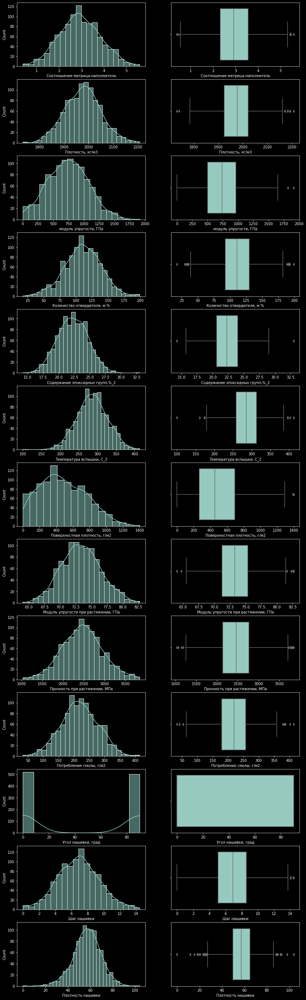

In [88]:
# Графики распределения переменных и диаграммы ящика с усами
fig, axes = plt.subplots(13, 2, figsize=(14, 50))
for k, column in enumerate(df.columns):    
    sns.histplot(data=df, x=column, kde=True, ax=axes[k, 0])
    sns.boxplot(data=df, x=column, ax=axes[k, 1])
plt.show()

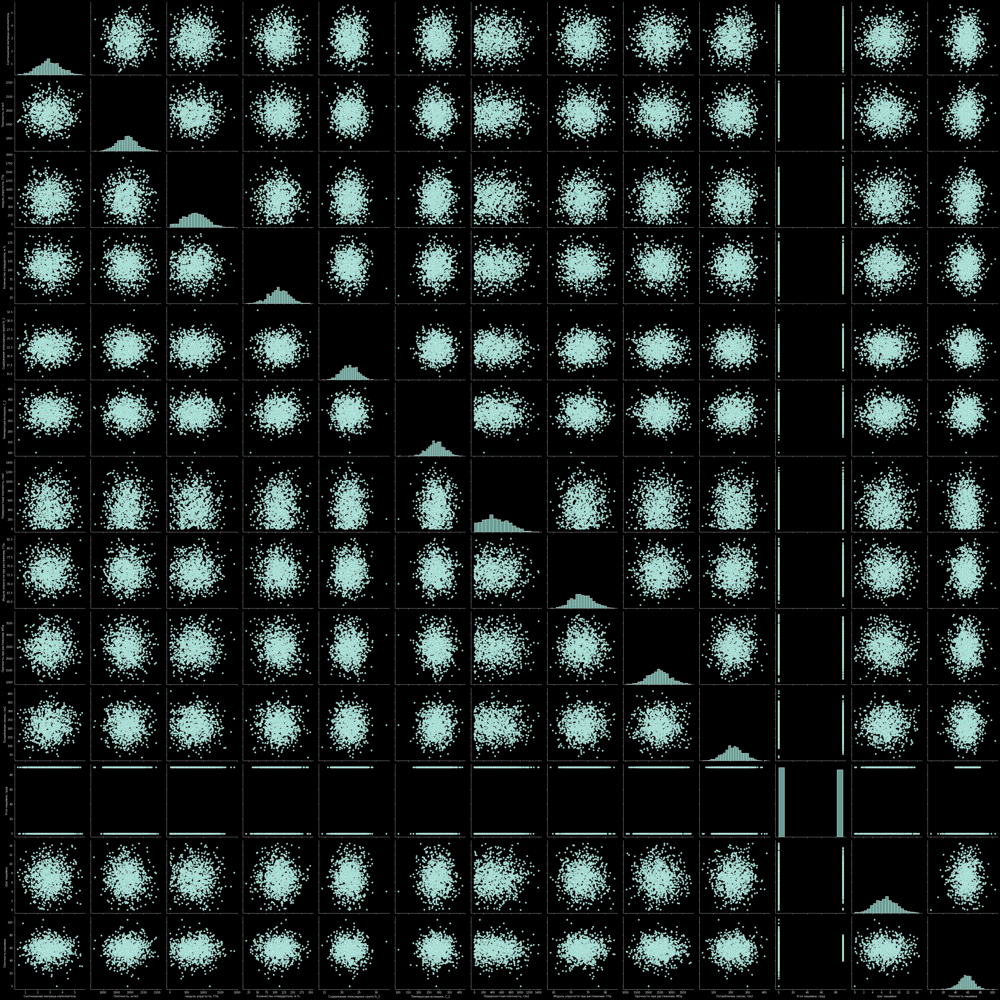

In [89]:
# Попарные графики рассеяния
sns.pairplot(df, height=4);

### Поиск выбросов

Для удаления выбросов существует 2 основных метода - метод 3-х сигм и межквартильных расстояний. Далее будет проводиться сравнение методов.

Соотношение матрица-наполнитель: 3s=0 iq=6


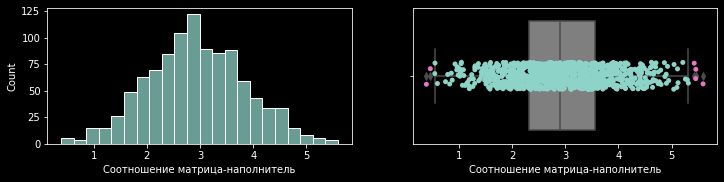

Плотность, кг/м3: 3s=3 iq=9


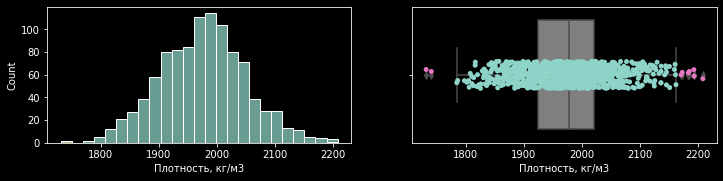

модуль упругости, ГПа: 3s=2 iq=2


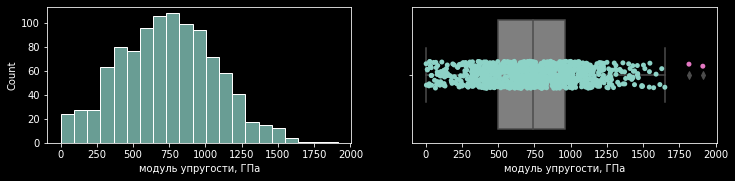

Количество отвердителя, м.%: 3s=2 iq=14


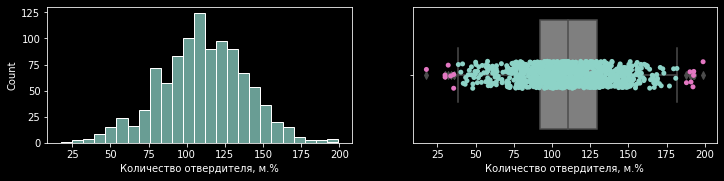

Содержание эпоксидных групп,%_2: 3s=2 iq=2


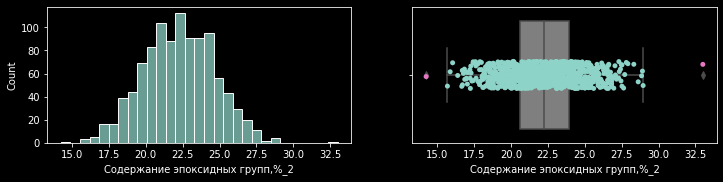

Температура вспышки, С_2: 3s=3 iq=8


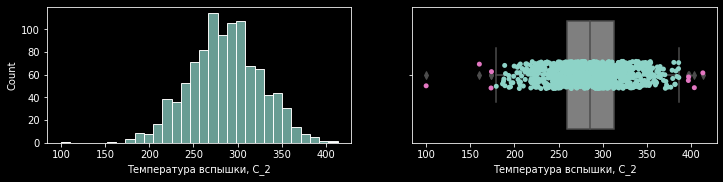

Поверхностная плотность, г/м2: 3s=2 iq=2


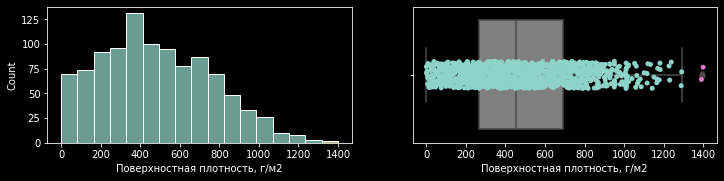

Модуль упругости при растяжении, ГПа: 3s=0 iq=6


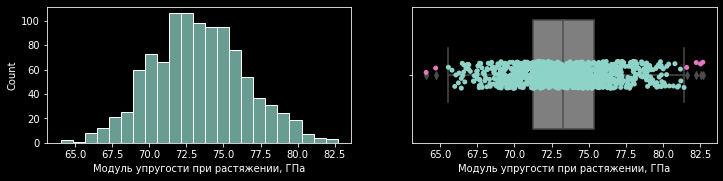

Прочность при растяжении, МПа: 3s=0 iq=11


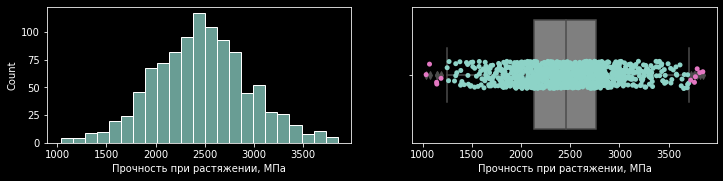

Потребление смолы, г/м2: 3s=3 iq=8


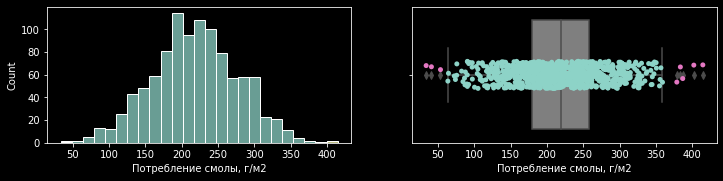

Угол нашивки, град: 3s=0 iq=0


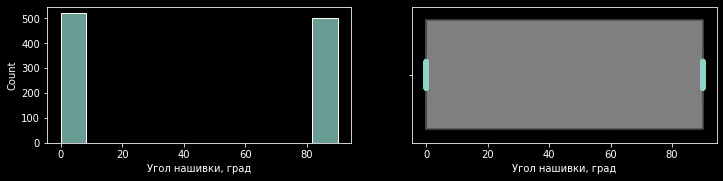

Шаг нашивки: 3s=0 iq=4


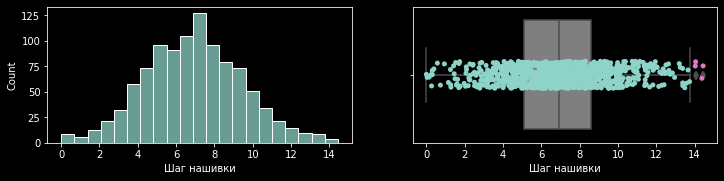

Плотность нашивки: 3s=7 iq=21


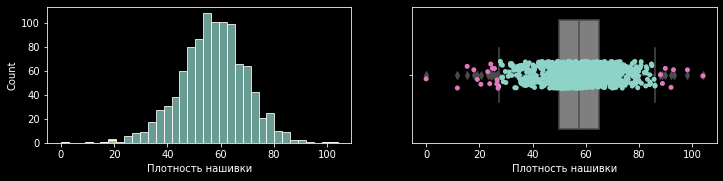

Метод 3-х сигм, выбросов: 24
Метод межквартильных расстояний, выбросов: 93


In [90]:
count_3s = 0
count_iq = 0
for column in df:
    d = df.loc[:, [column]]
   
    # метод 3-х сигм
    zscore = (df[column] - df[column].mean()) / df[column].std()
    d['3s'] = zscore.abs() > 3
    count_3s += d['3s'].sum()

    # метод межквартильных расстояний
    q1 = np.quantile(df[column], 0.25)
    q3 = np.quantile(df[column], 0.75)
    iqr = q3 - q1
    lower = q1 - 1.5 * iqr
    upper = q3 + 1.5 * iqr
    d['iq'] = (df[column] <= lower) | (df[column] >= upper)
    count_iq += d['iq'].sum()
    
    # визуализация выбросов
    print('{}: 3s={} iq={}'.format(column, d['3s'].sum(), d['iq'].sum()))
    fig, axes = plt.subplots(1, 2, figsize=(12, 2.5))
    sns.histplot(data=d, x=column, hue='3s', multiple='stack', legend=False, ax=axes[0])
    sns.boxplot(data=d, x=column, color='tab:gray', ax=axes[1])
    sns.stripplot(data=d[d['iq']==False], x=column, ax=axes[1])
    sns.stripplot(data=d[d['iq']==True], x=column, color='tab:pink', ax=axes[1])
    plt.show()

print('Метод 3-х сигм, выбросов:', count_3s)
print('Метод межквартильных расстояний, выбросов:', count_iq)

Так как данный датасет уже подготовлен, в нём отсутсовали пропуски и ошибки, то для исключения выбросов будет использоваться метод 3-х сигм, чтобы сохранить больше значимой информации.

In [91]:
outliers = pd.DataFrame(index=df.index)
for column in df:
    zscore = (df[column] - df[column].mean()) / df[column].std()
    outliers[column] = (zscore.abs() > 3)
df = df[outliers.sum(axis=1)==0]
df.shape

(1000, 13)

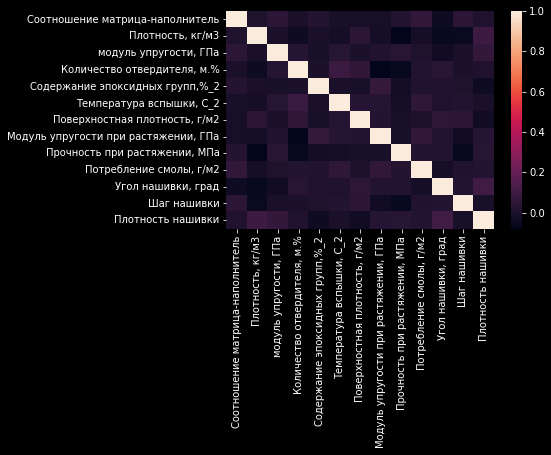

In [92]:
sns.heatmap(df.corr())
# Корреляция по Пирсону не наблюдается

In [93]:
! pip install phik

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [94]:
import phik
from phik.report import plot_correlation_matrix
from phik import report

In [95]:
phik_overview = df.phik_matrix()

interval columns not set, guessing: ['Соотношение матрица-наполнитель', 'Плотность, кг/м3', 'модуль упругости, ГПа', 'Количество отвердителя, м.%', 'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2', 'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа', 'Потребление смолы, г/м2', 'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки']


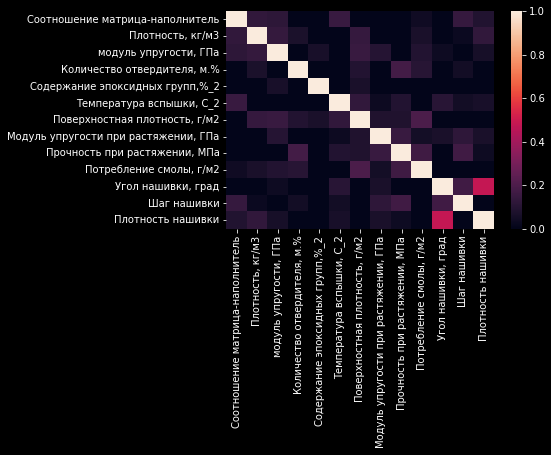

In [96]:
sns.heatmap(phik_overview)
# Корреляция Phik также практически не наблюдается

### Предобработка данных

Нормальзуем значения с помощью метода MinMaxScaler

In [97]:
min_max_scaler = MinMaxScaler()
df_norm = pd.DataFrame(min_max_scaler.fit_transform(df), columns = df.columns, index=df.index)
df_norm.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,0.489568,0.467648,0.447024,0.496427,0.493216,0.488654,0.371301,0.497322,0.507902,0.512370,0.496000,0.477193,0.507027
std,0.174687,0.178696,0.198876,0.171089,0.179818,0.174792,0.215155,0.167158,0.172506,0.170432,0.500234,0.177586,0.163634
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.370964,0.340831,0.302576,0.384097,0.368597,0.371985,0.206374,0.386234,0.390414,0.401220,0.000000,0.351886,0.405037
50%,0.484284,0.472347,0.448525,0.495388,0.492154,0.488205,0.348844,0.492609,0.504890,0.513653,0.000000,0.477999,0.509730
75%,0.608289,0.579727,0.582408,0.613258,0.624396,0.606271,0.535295,0.605138,0.612932,0.625772,1.000000,0.593714,0.612766
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


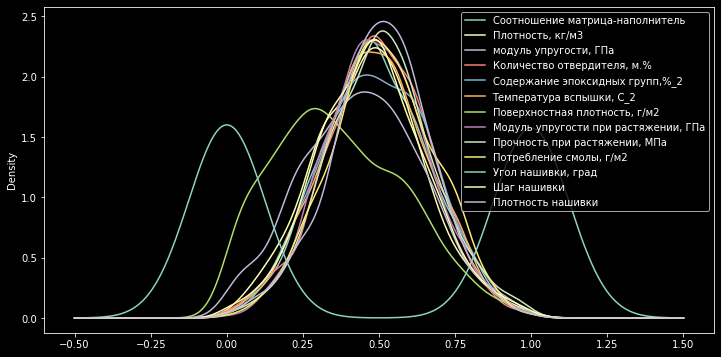

In [98]:
fig, ax = plt.subplots(figsize = (12, 6))
df_norm.plot(kind = 'kde', ax = ax)

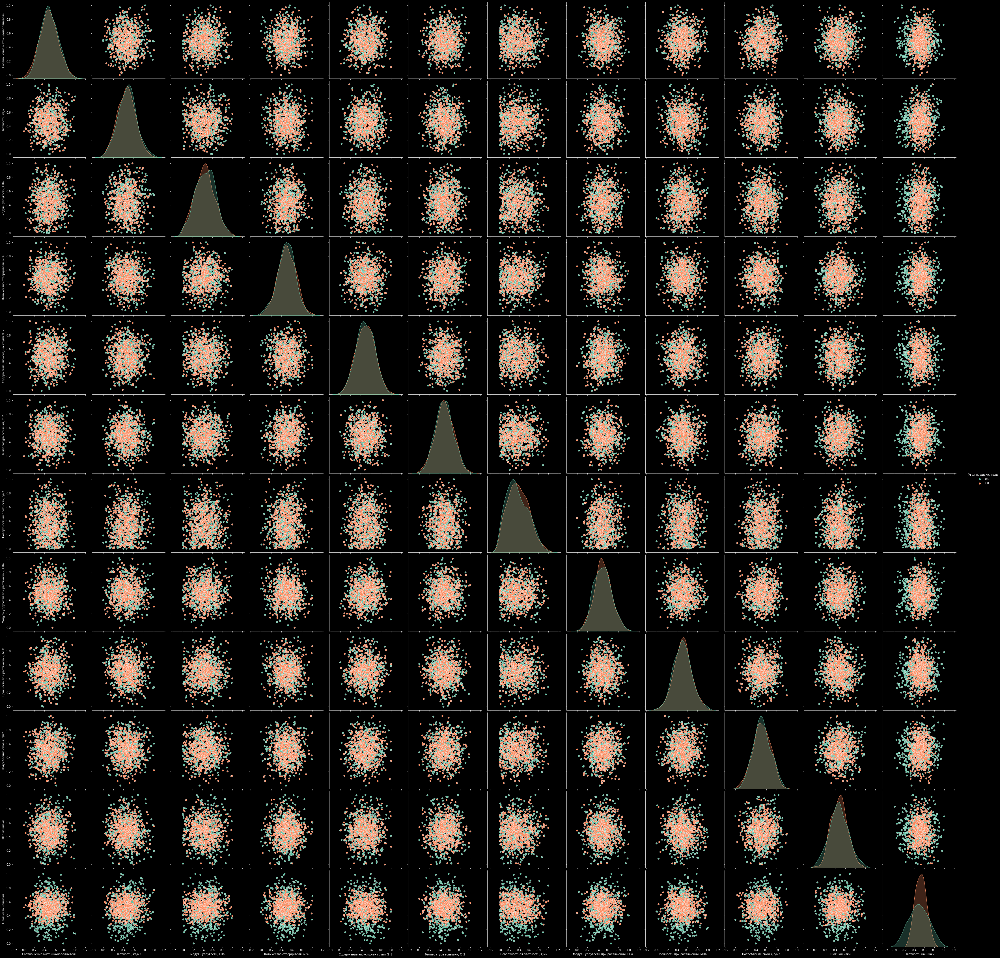

In [99]:
sns.pairplot(df_norm, hue = 'Угол нашивки, град', palette='Set2', height=4) 

In [100]:
df_norm_descr = df_norm.describe().T
df_norm_descr['median'] = df_norm.median()
df_norm_descr

,count,mean,std,min,25%,50%,75%,max,median
Соотношение матрица-наполнитель,1000.0,0.489568,0.174687,0.0,0.370964,0.484284,0.608289,1.0,0.484284
"Плотность, кг/м3",1000.0,0.467648,0.178696,0.0,0.340831,0.472347,0.579727,1.0,0.472347
"модуль упругости, ГПа",1000.0,0.447024,0.198876,0.0,0.302576,0.448525,0.582408,1.0,0.448525
"Количество отвердителя, м.%",1000.0,0.496427,0.171089,0.0,0.384097,0.495388,0.613258,1.0,0.495388
"Содержание эпоксидных групп,%_2",1000.0,0.493216,0.179818,0.0,0.368597,0.492154,0.624396,1.0,0.492154
"Температура вспышки, С_2",1000.0,0.488654,0.174792,0.0,0.371985,0.488205,0.606271,1.0,0.488205
"Поверхностная плотность, г/м2",1000.0,0.371301,0.215155,0.0,0.206374,0.348844,0.535295,1.0,0.348844
"Модуль упругости при растяжении, ГПа",1000.0,0.497322,0.167158,0.0,0.386234,0.492609,0.605138,1.0,0.492609
"Прочность при растяжении, МПа",1000.0,0.507902,0.172506,0.0,0.390414,0.504890,0.612932,1.0,0.504890
"Потребление смолы, г/м2",1000.0,0.512370,0.170432,0.0,0.401220,0.513653,0.625772,1.0,0.513653


Для дальнейшей работы, чтобы избежать ошибок и сложностей с добавлением валидационной выборки, мне будет удобнее использовать StandardScaler и OrdinalEncoder для признака "Угол нашивки, град". Он принимает значения 0 и 90, поэтому будем рассматриваться как категориальный.

Также мне будет удобнее выделить целевые признаки для каждой из следующих задач.

In [101]:
x_categorical = ['Угол нашивки, град']

In [102]:
# Определяю RANDOM_STATE для повторяемости результатов
RANDOM_STATE = 3128

## Обучение моделей для прогноза модуля упругости при растяжении и прочности при растяжении

### Модель для модуля упругости при растяжении, ГПа

In [103]:
# Признаки для модуля упругости при растяжении
y_upr_columns = ['Модуль упругости при растяжении, ГПа']
x_upr_columns = [
  'Соотношение матрица-наполнитель', 
  'Плотность, кг/м3',
  'модуль упругости, ГПа', 
  'Количество отвердителя, м.%',
  'Содержание эпоксидных групп,%_2', 
  'Температура вспышки, С_2',
  'Поверхностная плотность, г/м2', 
  'Потребление смолы, г/м2',
  'Угол нашивки, град', 
  'Шаг нашивки', 
  'Плотность нашивки'
]

In [104]:
y_upr = df.loc[:, y_upr_columns]
x_upr = df.loc[:, x_upr_columns]

In [105]:
x_upr_continuous = [column for column in x_upr_columns if column not in x_categorical]

In [106]:
# Препроцессор 
preprocessor_upr = ColumnTransformer(transformers=[
        ("continuous", StandardScaler(), x_upr_continuous),
        ("categorical", OrdinalEncoder(), x_categorical)
])

In [107]:
# Разделение на тренировочную и тестовую выборку
X_upr_train_raw, X_upr_test_raw, y_upr_train, y_upr_test = train_test_split(x_upr, y_upr, test_size=0.3, random_state=RANDOM_STATE)
print('X_upr_train_raw:', X_upr_train_raw.shape, 'y_upr_train:', y_upr_train.shape)
print('X_upr_test_raw:', X_upr_test_raw.shape, 'y_upr_test:', y_upr_test.shape)

X_upr_train_raw: (700, 11) y_upr_train: (700, 1)
X_upr_test_raw: (300, 11) y_upr_test: (300, 1)


In [108]:
# Препроцессинг входных переменных
X_upr_train = preprocessor_upr.fit_transform(X_upr_train_raw)
X_upr_test = preprocessor_upr.transform(X_upr_test_raw)

In [109]:
# Выходная переменная преобразованиям не подвергается
y_upr_train = y_upr_train['Модуль упругости при растяжении, ГПа'].values
y_upr_test = y_upr_test['Модуль упругости при растяжении, ГПа'].values

Метод k-ближайших соседей

In [110]:
knr = KNeighborsRegressor()
knr_params = {'n_neighbors' : range(1, 301, 2), 
          'weights' : ['uniform', 'distance'],
          'algorithm' : ['auto', 'ball_tree', 'kd_tree', 'brute']
          }
GSCV_knr_upr = GridSearchCV(knr, knr_params, n_jobs=-1, cv=10)
GSCV_knr_upr.fit(X_upr_train, y_upr_train)
GSCV_knr_upr.best_params_

{'algorithm': 'auto', 'n_neighbors': 213, 'weights': 'uniform'}

In [111]:
knr_upr = GSCV_knr_upr.best_estimator_
print(f'R2-score KNR для модуля упругости при растяжении: {knr_upr.score(X_upr_test, y_upr_test).round(3)}')

R2-score KNR для модуля упругости при растяжении: -0.01


In [112]:
models = pd.DataFrame()

In [116]:
knr_upr_result = pd.DataFrame({
   'Model': 'KNeighborsRegressor_upr', 
   'MAE': mean_absolute_error(y_upr_test, knr_upr.predict(X_upr_test)), 
   'R2 score': knr_upr.score(X_upr_test, y_upr_test).round(3)
}, index=['Модуль упругости при растяжении'])

In [117]:
models = pd.concat([models, knr_upr_result])

Стохастический градиентный спуск

In [143]:
sgd = SGDRegressor()
sgd_params = {'loss' : ['squared_error', 'huber', 'epsilon_insensitive', 'squared_epsilon_insensitive'], 
          'penalty' : ['elasticnet', 'l2', 'l1'],
          'alpha' : [0.0001, 0.001, 0.01, 0.0002, 0.002],
          'learning_rate' : ['optimal', 'invscaling', 'adaptive'],
          'epsilon' : [0.1, 0.01, 0.2, 0.02]
          }
GSCV_sgd_upr = GridSearchCV(sgd, sgd_params, cv=10, verbose=0)
GSCV_sgd_upr.fit(X_upr_train, np.ravel(y_upr_train))
GSCV_sgd_upr.best_params_

{'alpha': 0.01,
 'epsilon': 0.01,
 'learning_rate': 'optimal',
 'loss': 'squared_error',
 'penalty': 'elasticnet'}

In [144]:
sgd_upr = GSCV_sgd_upr.best_estimator_
print(f'R2-score SGD для модуля упругости при растяжении: {sgd_upr.score(X_upr_test, y_upr_test).round(3)}')
print(mean_absolute_error(y_upr_test, sgd_upr.predict(X_upr_test)))

R2-score SGD для модуля упругости при растяжении: -0.007
2.5859473569747355


In [145]:
sgd_upr_result = pd.DataFrame({
   'Model': 'SGDRegressor_upr', 
   'MAE': mean_absolute_error(y_upr_test, sgd_upr.predict(X_upr_test)), 
   'R2 score': sgd_upr.score(X_upr_test, y_upr_test).round(3)
}, index=['Модуль упругости при растяжении'])

In [146]:
models = pd.concat([models, sgd_upr_result])

Линейная регрессия

In [147]:
lr = LinearRegression()
lr_params = {
    'fit_intercept' : ['True', 'False']
}
GSCV_lr_upr = GridSearchCV(lr, lr_params, n_jobs=-1, cv=10)
GSCV_lr_upr.fit(X_upr_train, y_upr_train)
GSCV_lr_upr.best_params_

{'fit_intercept': 'True'}

In [148]:
lr_upr = GSCV_lr_upr.best_estimator_
print(f'R2-score LR для модуля упругости при растяжении: {lr_upr.score(X_upr_test, y_upr_test).round(3)}')

R2-score LR для модуля упругости при растяжении: -0.02


In [149]:
lr_upr_result = pd.DataFrame({
   'Model': 'LinearRegression_upr', 
   'MAE': mean_absolute_error(y_upr_test, lr_upr.predict(X_upr_test)), 
   'R2 score': lr_upr.score(X_upr_test, y_upr_test).round(3)
}, index=['Модуль упругости при растяжении'])

In [150]:
models = pd.concat([models, lr_upr_result])

Случайный лес

In [151]:
rfr = RandomForestRegressor()
rfr_params = {
    'n_estimators' : range(10, 1000, 10),
    'criterion' : ['squared_error', 'absolute_error', 'poisson'],
    'max_depth' : range(1, 7),
    'min_samples_split' : range(20, 50, 5),
    'min_samples_leaf' : range(2, 8),
    'bootstrap' : ['True', 'False']
}
RSCV_rfr_upr = RandomizedSearchCV(rfr, rfr_params, n_jobs=-1, cv=10, verbose=4)
RSCV_rfr_upr.fit(X_upr_train, np.ravel(y_upr_train))
RSCV_rfr_upr.best_params_

Fitting 10 folds for each of 10 candidates, totalling 100 fits


{'n_estimators': 690,
 'min_samples_split': 30,
 'min_samples_leaf': 5,
 'max_depth': 1,
 'criterion': 'absolute_error',
 'bootstrap': 'False'}

In [152]:
rfr_upr = RSCV_rfr_upr.best_estimator_
print(f'R2-score RFR для модуля упругости при растяжении: {rfr_upr.score(X_upr_test, y_upr_test).round(3)}')

R2-score RFR для модуля упругости при растяжении: -0.007


In [153]:
rfr_upr_result = pd.DataFrame({
   'Model': 'RandomForestRegressor_upr', 
   'MAE': mean_absolute_error(y_upr_test, rfr_upr.predict(X_upr_test)), 
   'R2 score': rfr_upr.score(X_upr_test, y_upr_test).round(3)
}, index=['Модуль упругости при растяжении'])

In [154]:
models = pd.concat([models, rfr_upr_result])


### Модель для прочности при растяжении, МПа

In [155]:
# Признаки для прочности при растяжении
y_pr_columns = ['Прочность при растяжении, МПа']
x_pr_columns = [
  'Соотношение матрица-наполнитель', 
  'Плотность, кг/м3',
  'модуль упругости, ГПа', 
  'Количество отвердителя, м.%',
  'Содержание эпоксидных групп,%_2', 
  'Температура вспышки, С_2',
  'Поверхностная плотность, г/м2', 
  'Потребление смолы, г/м2',
  'Угол нашивки, град', 
  'Шаг нашивки', 
  'Плотность нашивки'
]

In [156]:
x_pr = df.loc[:, x_pr_columns]
y_pr = df.loc[:, y_pr_columns]

In [157]:
x_pr_continuous = [column for column in x_pr_columns if column not in x_categorical]

In [158]:
preprocessor_pr = ColumnTransformer(transformers=[
        ("continuous", StandardScaler(), x_pr_continuous),
        ("categorical", OrdinalEncoder(), x_categorical)
])

In [159]:
# Разделение на тренировочную и тестовую выборку
X_pr_train_raw, X_pr_test_raw, y_pr_train, y_pr_test = train_test_split(x_pr, y_pr, test_size=0.3, random_state=RANDOM_STATE)
print('X_pr_train:', X_pr_train_raw.shape, 'y_pr_train:', y_pr_train.shape)
print('X_pr_test:', X_pr_test_raw.shape, 'y_pr_test:', y_pr_test.shape)

X_pr_train: (700, 11) y_pr_train: (700, 1)
X_pr_test: (300, 11) y_pr_test: (300, 1)


In [160]:
# Препроцессинг входных переменных
X_pr_test = preprocessor_pr.fit_transform(X_pr_test_raw)
X_pr_train = preprocessor_pr.transform(X_pr_train_raw)

In [161]:
# Выходная переменная
y_pr_train = y_pr_train['Прочность при растяжении, МПа'].values
y_pr_test = y_pr_test['Прочность при растяжении, МПа'].values

Метод k-ближайших соседей

In [162]:
GSCV_knr_pr = GridSearchCV(knr, knr_params, n_jobs=-1, cv=10)
GSCV_knr_pr.fit(X_pr_train, y_pr_train)
GSCV_knr_pr.best_params_

{'algorithm': 'auto', 'n_neighbors': 153, 'weights': 'uniform'}

In [163]:
knr_pr = GSCV_knr_pr.best_estimator_
print(f'R2-score KNR для прочности при растяжении: {knr_pr.score(X_pr_test, y_pr_test).round(3)}')

R2-score KNR для прочности при растяжении: 0.002


In [164]:
knr_pr_result = pd.DataFrame({
   'Model': 'KNeighborsRegressor_pr', 
   'MAE': mean_absolute_error(y_pr_test, knr_pr.predict(X_pr_test)), 
   'R2 score': knr_pr.score(X_pr_test, y_pr_test).round(3)
}, index=['Прочность при растяжении'])

In [165]:
models = pd.concat([models, knr_pr_result])

Стохастический градиентный спуск

In [166]:
GSCV_sgd_pr = GridSearchCV(sgd, sgd_params, cv=10)
GSCV_sgd_pr.fit(X_pr_train, np.ravel(y_pr_train))
GSCV_sgd_pr.best_params_

{'alpha': 0.01,
 'epsilon': 0.1,
 'learning_rate': 'adaptive',
 'loss': 'epsilon_insensitive',
 'penalty': 'elasticnet'}

In [167]:
sgd_pr = GSCV_sgd_pr.best_estimator_
print(f'R2-score KNR для модуля упругости при растяжении: {sgd_pr.score(X_pr_test, y_pr_test).round(3)}')
print(mean_absolute_error(y_pr_test, sgd_pr.predict(X_pr_test)))

R2-score KNR для модуля упругости при растяжении: 0.0
374.8362751664868


In [168]:
sgd_pr_result = pd.DataFrame({
   'Model': 'SGDRegressor_pr', 
   'MAE': mean_absolute_error(y_pr_test, sgd_pr.predict(X_pr_test)), 
   'R2 score': sgd_pr.score(X_pr_test, y_pr_test).round(3)
}, index=['Прочность при растяжении'])

In [169]:
models = pd.concat([models, sgd_pr_result])

Линейная регрессия

In [170]:
GSCV_lr_pr = GridSearchCV(lr, lr_params, n_jobs=-1, cv=10)
GSCV_lr_pr.fit(X_pr_train, y_pr_train)
GSCV_lr_pr.best_params_

{'fit_intercept': 'True'}

In [171]:
lr_pr = GSCV_lr_pr.best_estimator_
print(f'R2-score LR для прочности при растяжении: {lr_pr.score(X_pr_test, y_pr_test).round(3)}')

R2-score LR для прочности при растяжении: 0.003


In [172]:
lr_pr_result = pd.DataFrame({
   'Model': 'LinearRegression_pr', 
   'MAE': mean_absolute_error(y_pr_test, lr_pr.predict(X_pr_test)), 
   'R2 score': lr_pr.score(X_pr_test, y_pr_test).round(3)
}, index=['Прочность при растяжении'])

In [173]:
models = pd.concat([models, lr_pr_result])

Случайный лес

In [174]:
RSCV_rfr_pr = RandomizedSearchCV(rfr, rfr_params, n_jobs=-1, cv=10, verbose=4)
RSCV_rfr_pr.fit(X_pr_train, np.ravel(y_pr_train))
RSCV_rfr_pr.best_params_

Fitting 10 folds for each of 10 candidates, totalling 100 fits


{'n_estimators': 970,
 'min_samples_split': 25,
 'min_samples_leaf': 2,
 'max_depth': 2,
 'criterion': 'absolute_error',
 'bootstrap': 'False'}

In [175]:
rfr_pr = RSCV_rfr_pr.best_estimator_
print(f'R2-score RFR для прочности при растяжении: {rfr_pr.score(X_pr_test, y_pr_test).round(3)}')

R2-score RFR для прочности при растяжении: 0.008


In [176]:
rfr_pr_result = pd.DataFrame({
   'Model': 'RandomForestRegressor_pr', 
   'MAE': mean_absolute_error(y_pr_test, rfr_pr.predict(X_pr_test)), 
   'R2 score': rfr_pr.score(X_pr_test, y_pr_test).round(3)
}, index=['Прочность при растяжении'])

In [177]:
models = pd.concat([models, rfr_pr_result])

Коэффициент детерминации R2 близок к 0.
Ни одна из выбранных мной моделей не оказалась подходящей для наших данных.

In [178]:
models

,Model,MAE,R2 score
Модуль упругости при растяжении,KNeighborsRegressor_upr,2.595627,-0.010
Модуль упругости при растяжении,LinearRegression_upr,2.629340,-0.020
Модуль упругости при растяжении,SGDRegressor_upr,2.585947,-0.007
Модуль упругости при растяжении,LinearRegression_upr,2.629340,-0.020
Модуль упругости при растяжении,RandomForestRegressor_upr,2.579453,-0.007
Прочность при растяжении,KNeighborsRegressor_pr,376.049391,0.002
Прочность при растяжении,SGDRegressor_pr,374.836275,0.000
Прочность при растяжении,LinearRegression_pr,375.763729,0.003
Прочность при растяжении,RandomForestRegressor_pr,374.690036,0.008


Text(0.5, 1.0, 'Средняя абсолютная ошибка моделей прогноза Модуля упругости при растяжении, ГПа')

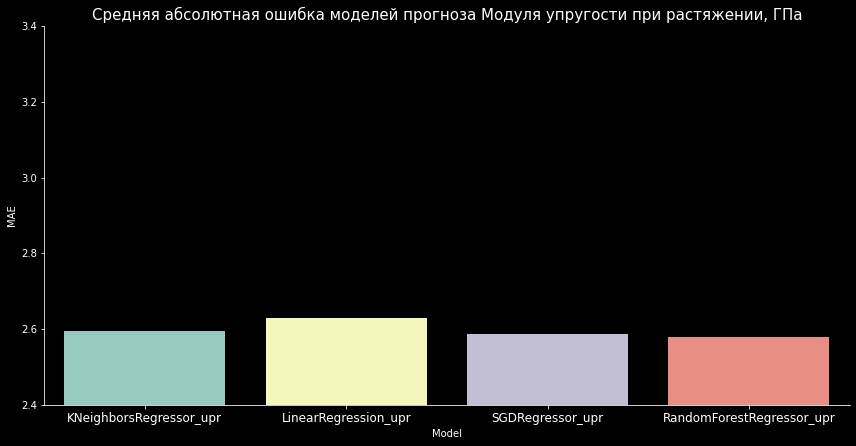

In [179]:
sns.catplot(data=models[0:5], x='Model', y='MAE', kind='bar', height=6, aspect=2)
plt.ylim(ymin=2.4, ymax=3.4)
plt.xticks(size=12)
plt.title('Средняя абсолютная ошибка моделей прогноза Модуля упругости при растяжении, ГПа', size=15)

Text(0.5, 1.0, 'Средняя абсолютная ошибка моделей прогноза Прочности при растяжении, МПа')

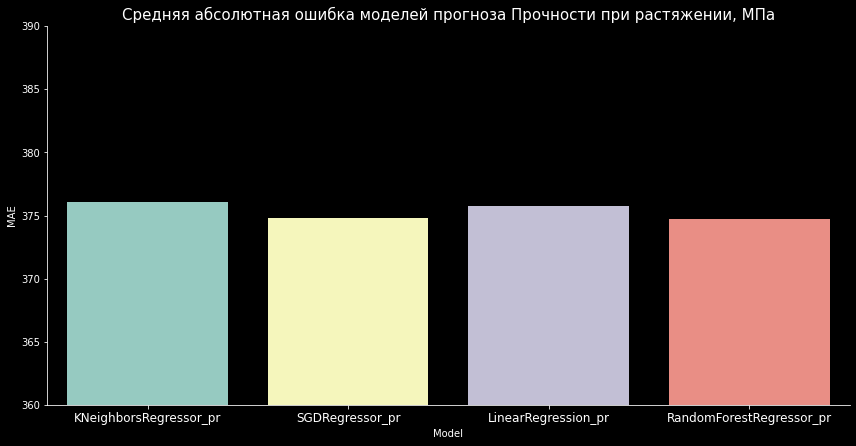

In [180]:
sns.catplot(data=models[5:10], x='Model', y='MAE', kind='bar', height=6, aspect=2)
plt.ylim(ymin=360, ymax=390)
plt.xticks(size=12)
plt.title('Средняя абсолютная ошибка моделей прогноза Прочности при растяжении, МПа', size=15)

## Нейронная сеть для рекомендации соотношения матрица-наполнитель 

In [181]:
y_mn_columns = ['Соотношение матрица-наполнитель']
x_mn_columns = [
  'Плотность, кг/м3',
  'модуль упругости, ГПа', 
  'Количество отвердителя, м.%',
  'Содержание эпоксидных групп,%_2', 
  'Температура вспышки, С_2',
  'Поверхностная плотность, г/м2', 
  'Модуль упругости при растяжении, ГПа',
  'Прочность при растяжении, МПа', 
  'Потребление смолы, г/м2',
  'Угол нашивки, град', 
  'Шаг нашивки', 
  'Плотность нашивки'
]

In [182]:
x_mn = df.loc[:, x_mn_columns]
y_mn = df.loc[:, y_mn_columns]

In [183]:
x_mn_continuous = [column for column in x_mn_columns if column not in x_categorical]

In [184]:
# Препроцессор
preprocessor_mn = ColumnTransformer(transformers=[
        ("continuous", StandardScaler(), x_mn_continuous),
        ("categorical", OrdinalEncoder(), x_categorical)
])

In [185]:
# Разделение на тренировочную и тестовую выборку
X_mn_train_raw, X_mn_test_raw, y_mn_train, y_mn_test = train_test_split(x_mn, y_mn, test_size=0.3, random_state=RANDOM_STATE)
print('x_mn_train:', X_mn_train_raw.shape, 'y_mn_train:', y_mn_train.shape)
print('x_mn_test:', X_mn_test_raw.shape, 'y_mn_test:', y_mn_test.shape)

x_mn_train: (700, 12) y_mn_train: (700, 1)
x_mn_test: (300, 12) y_mn_test: (300, 1)


In [186]:
# Препроцессинг входных переменных
X_mn_test = preprocessor_mn.fit_transform(X_mn_test_raw)
X_mn_train = preprocessor_mn.transform(X_mn_train_raw)

In [187]:
# Выходная переменная
y_mn_train = y_mn_train['Соотношение матрица-наполнитель'].values
y_mn_test = y_mn_test['Соотношение матрица-наполнитель'].values

In [188]:
# Базовая модель
base_model_mn = DummyRegressor(strategy='mean')

In [189]:
# Предсказание базовой модели
base_model_mn.fit(X_mn_train, y_mn_train)
y_mn_pred_base = base_model_mn.predict(X_mn_test)

In [190]:
# Чтобы избежать переобучения используем Dropout слои
model_mn = tf.keras.Sequential([
      keras.layers.Input(shape=(12,), name='in'),                   
      keras.layers.Dense(units=24, activation='relu', name='dense_1'),
      keras.layers.Dropout(0.05, name='dropout_1'),
      keras.layers.Dense(units=24, activation='relu', name='dense_2'),
      keras.layers.Dropout(0.05, name='dropout_2'),
      keras.layers.Dense(units=24, activation='relu', name='dense_3'),
      keras.layers.Dropout(0.05, name='dropout_3'),
      keras.layers.Dense(units=24, activation='relu', name='dense_4'),
      keras.layers.Dropout(0.05, name='dropout_4'),
      keras.layers.Dense(units=24, activation='relu', name='dense_5'),
      keras.layers.Dropout(0.05, name='dropout_5'),
      keras.layers.Dense(units=24, activation='relu', name='dense_6'),
      keras.layers.Dropout(0.05, name='dropout_6'),
      keras.layers.Dense(units=24, activation='relu', name='dense_7'),
      keras.layers.Dropout(0.05, name='dropout_7'),
      keras.layers.Dense(units=24, activation='relu', name='dense_8'),
      keras.layers.Dropout(0.05, name='dropout_8'),
      keras.layers.Dense(units=1, name='out')                        
    ])

In [191]:
# Функция, компилирующая нейросеть
def compile_model(model):
    model.compile(
      optimizer=keras.optimizers.Adam(),
      loss=keras.losses.MeanAbsolutePercentageError(),
      metrics=[tf.keras.metrics.RootMeanSquaredError()]
    )
    return model

In [192]:
# Функция для построения графика ошибки
def plot_loss(history):
  fig, axes = plt.subplots(1, 2, figsize=(12, 5))
  axes[0].plot(history['loss'], label='loss')
  axes[0].plot(history['val_loss'], label='val_loss')
  axes[0].set_xlabel('Эпоха')
  axes[0].set_ylabel('MAPE')
  axes[0].legend()
  axes[0].grid(True)
  axes[1].plot(history['root_mean_squared_error'], label='loss')
  axes[1].plot(history['val_root_mean_squared_error'], label='val_loss')
  axes[1].set_xlabel('Эпоха')
  axes[1].set_ylabel('RMSE')
  axes[1].legend()
  axes[1].grid(True)
  plt.show()

In [193]:
# Компиляция модели
model_mn = compile_model(model_mn)

In [194]:
model_mn.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1 (Dense)             (None, 24)                312       
                                                                 
 dropout_1 (Dropout)         (None, 24)                0         
                                                                 
 dense_2 (Dense)             (None, 24)                600       
                                                                 
 dropout_2 (Dropout)         (None, 24)                0         
                                                                 
 dense_3 (Dense)             (None, 24)                600       
                                                                 
 dropout_3 (Dropout)         (None, 24)                0         
                                                                 
 dense_4 (Dense)             (None, 24)               

In [195]:
%%time
#Обучение нейросети
history = model_mn.fit(
  X_mn_train, 
  y_mn_train, 
  epochs=50, 
  validation_split=0.3, 
  verbose=1
)

Epoch 1/50
16/16 [==============================] - 1s 17ms/step - loss: 92.1355 - root_mean_squared_error: 2.8470 - val_loss: 79.9796 - val_root_mean_squared_error: 2.5729
Epoch 2/50
16/16 [==============================] - 0s 6ms/step - loss: 57.8110 - root_mean_squared_error: 1.9700 - val_loss: 34.8859 - val_root_mean_squared_error: 1.2039
Epoch 3/50
16/16 [==============================] - 0s 5ms/step - loss: 40.3633 - root_mean_squared_error: 1.3314 - val_loss: 34.5537 - val_root_mean_squared_error: 1.2733
Epoch 4/50
16/16 [==============================] - 0s 6ms/step - loss: 37.7414 - root_mean_squared_error: 1.2973 - val_loss: 32.4296 - val_root_mean_squared_error: 1.1612
Epoch 5/50
16/16 [==============================] - 0s 5ms/step - loss: 36.9345 - root_mean_squared_error: 1.2179 - val_loss: 32.7318 - val_root_mean_squared_error: 1.1987
Epoch 6/50
16/16 [==============================] - 0s 6ms/step - loss: 35.6521 - root_mean_squared_error: 1.1527 - val_loss: 32.2678 - val

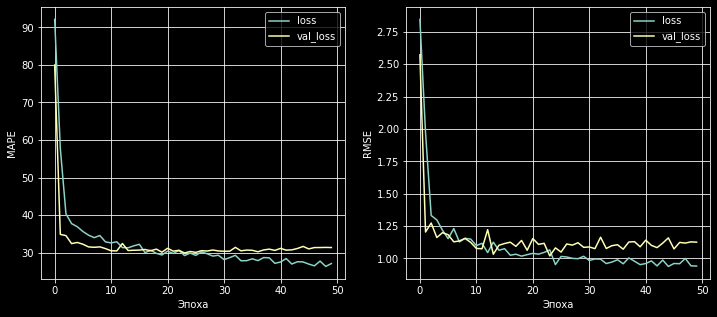

In [196]:
plot_loss(history.history)

In [197]:
# Проверка точности нейросети на тестовых данных
model_mn.evaluate(X_mn_test, y_mn_test)

10/10 [==============================] - 0s 3ms/step - loss: 32.6038 - root_mean_squared_error: 1.1360


[32.60379409790039, 1.1359508037567139]

In [198]:
# Предсказание 
y_mn_pred_keras4 = model_mn.predict(X_mn_test)

10/10 [==============================] - 0s 2ms/step


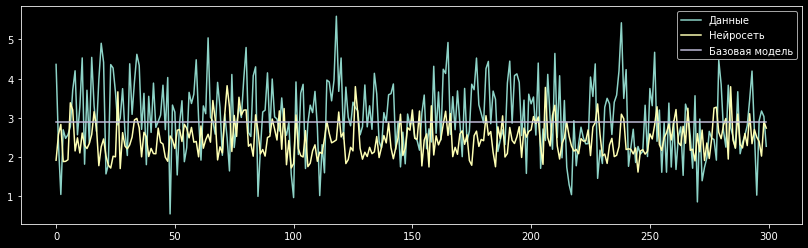

In [199]:
#Визуализация
fig, ax = plt.subplots(figsize=(14, 4))
ax.plot(y_mn_test, label='Данные')
ax.plot(y_mn_pred_keras4, label='Нейросеть')
ax.plot(y_mn_pred_base, label='Базовая модель')
ax.legend()
plt.show()

In [200]:
def get_metrics(model_name, y, y_pred):
    stat = pd.DataFrame()
    stat.loc[model_name, 'R2'] = metrics.r2_score(y, y_pred)
    stat.loc[model_name, 'RMSE'] = metrics.mean_squared_error(y, y_pred, squared=False) * -1
    stat.loc[model_name, 'MAE'] = metrics.mean_absolute_error(y, y_pred) * -1
    stat.loc[model_name, 'MAPE'] = metrics.mean_absolute_percentage_error(y, y_pred) * -1
    stat.loc[model_name, 'max_error'] = metrics.max_error(y, y_pred) * -1
    return stat

In [201]:
# Сравнение предсказаний c базовой моделью
compare = get_metrics('DummyRegressor', y_mn_test, y_mn_pred_base)
compare = compare.append(get_metrics('Нейросеть', y_mn_test, y_mn_pred_keras4))
compare

,R2,RMSE,MAE,MAPE,max_error
DummyRegressor,-0.011269,-0.911261,-0.737067,-0.299795,-2.684301
Нейросеть,-0.571450,-1.135951,-0.928252,-0.326038,-3.152158


### Сохранение модели

In [215]:
models_path = '../'

In [211]:
def save_object_with_pickle(obj, obj_name):
  filename = models_path + obj_name
  file = open(filename, 'wb')
  pickle.dump(obj, file)
  file.close()

In [213]:
save_object_with_pickle(preprocessor_mn, 'preprocessor_mn')

In [214]:
save_object_with_pickle(model_mn, 'model_mn')